# packge imports and installs

In [187]:
!pip install -U -q segmentation-models

In [188]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import tensorflow as tf
tf.config.run_functions_eagerly(True)
from tensorflow import keras

import segmentation_models as sm

In [189]:
!pip install seaborn

In [190]:
import numpy as np
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
import cv2
from PIL import Image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.callbacks import LearningRateScheduler
import tensorflow_addons as tfa
from tensorflow.keras.models import load_model



# source paths

In [191]:
train_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/train'
validation_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/validation'
test_folder = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/test'

# model code

In [192]:
def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

# Getting the x signal to the same shape as the gating signal
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

# Getting the gating signal to the same number of filters as the inter_shape
    phi_g = layers.Conv2D(inter_shape, (1, 1), padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3),
                                 strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]),
                                 padding='same')(phi_g)  # 16

    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = repeat_elem(upsample_psi, shape_x[3])

    y = layers.multiply([upsample_psi, x])

    result = layers.Conv2D(shape_x[3], (1, 1), padding='same')(y)
    result_bn = layers.BatchNormalization()(result)
    return result_bn

In [193]:
def gating_signal(input, out_size, batch_norm=False):
    """
    resize the down layer feature map into the same dimension as the up layer feature map
    using 1x1 conv
    :return: the gating feature map with the same dimension of the up layer feature map
    """
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

In [194]:
def res_conv_block(x, filter_size, size, dropout, batch_norm=False):
    '''
    Residual convolutional layer.
    Two variants....
    Either put activation function before the addition with shortcut
    or after the addition (which would be as proposed in the original resNet).
    
    1. conv - BN - Activation - conv - BN - Activation 
                                          - shortcut  - BN - shortcut+BN
                                          
    2. conv - BN - Activation - conv - BN   
                                     - shortcut  - BN - shortcut+BN - Activation                                     
    
    Check fig 4 in https://arxiv.org/ftp/arxiv/papers/1802/1802.06955.pdf
    '''

    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(x)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation('relu')(conv)
    
    conv = layers.Conv2D(size, (filter_size, filter_size), padding='same')(conv)
    if batch_norm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    #conv = layers.Activation('relu')(conv)    #Activation before addition with shortcut
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)

    shortcut = layers.Conv2D(size, kernel_size=(1, 1), padding='same')(x)
    if batch_norm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)

    res_path = layers.add([shortcut, conv])
    res_path = layers.Activation('relu')(res_path)    #Activation after addition with shortcut (Original residual block)
    return res_path

In [195]:
def repeat_elem(tensor, rep):
    # lambda function to repeat Repeats the elements of a tensor along an axis
    #by a factor of rep.
    # If tensor has shape (None, 256,256,3), lambda will return a tensor of shape 
    #(None, 256,256,6), if specified axis=3 and rep=2.

     return layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3),
                          arguments={'repnum': rep})(tensor)


In [196]:
def Attention_ResUNet(input_shape, NUM_CLASSES=1, dropout_rate=0.0, batch_norm=True):
    '''
    Rsidual UNet, with attention 
    
    '''
    # network structure
    FILTER_NUM = 64 # number of basic filters for the first layer
    FILTER_SIZE = 3 # size of the convolutional filter
    UP_SAMP_SIZE = 2 # size of upsampling filters
    # input data
    # dimension of the image depth
    inputs = layers.Input(input_shape, dtype=tf.float32)
    axis = 3

    # Downsampling layers
    # DownRes 1, double residual convolution + pooling
    conv_128 = res_conv_block(inputs, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)
    pool_64 = layers.MaxPooling2D(pool_size=(2,2))(conv_128)
    # DownRes 2
    conv_64 = res_conv_block(pool_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    pool_32 = layers.MaxPooling2D(pool_size=(2,2))(conv_64)
    # DownRes 3
    conv_32 = res_conv_block(pool_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    pool_16 = layers.MaxPooling2D(pool_size=(2,2))(conv_32)
    # DownRes 4
    conv_16 = res_conv_block(pool_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    pool_8 = layers.MaxPooling2D(pool_size=(2,2))(conv_16)
    # DownRes 5, convolution only
    conv_8 = res_conv_block(pool_8, FILTER_SIZE, 16*FILTER_NUM, dropout_rate, batch_norm)

    # Upsampling layers
    # UpRes 6, attention gated concatenation + upsampling + double residual convolution
    gating_16 = gating_signal(conv_8, 8*FILTER_NUM, batch_norm)
    att_16 = attention_block(conv_16, gating_16, 8*FILTER_NUM)
    up_16 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(conv_8)
    up_16 = layers.concatenate([up_16, att_16], axis=axis)
    up_conv_16 = res_conv_block(up_16, FILTER_SIZE, 8*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 7
    gating_32 = gating_signal(up_conv_16, 4*FILTER_NUM, batch_norm)
    att_32 = attention_block(conv_32, gating_32, 4*FILTER_NUM)
    up_32 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_16)
    up_32 = layers.concatenate([up_32, att_32], axis=axis)
    up_conv_32 = res_conv_block(up_32, FILTER_SIZE, 4*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 8
    gating_64 = gating_signal(up_conv_32, 2*FILTER_NUM, batch_norm)
    att_64 = attention_block(conv_64, gating_64, 2*FILTER_NUM)
    up_64 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_32)
    up_64 = layers.concatenate([up_64, att_64], axis=axis)
    up_conv_64 = res_conv_block(up_64, FILTER_SIZE, 2*FILTER_NUM, dropout_rate, batch_norm)
    # UpRes 9
    gating_128 = gating_signal(up_conv_64, FILTER_NUM, batch_norm)
    att_128 = attention_block(conv_128, gating_128, FILTER_NUM)
    up_128 = layers.UpSampling2D(size=(UP_SAMP_SIZE, UP_SAMP_SIZE), data_format="channels_last")(up_conv_64)
    up_128 = layers.concatenate([up_128, att_128], axis=axis)
    up_conv_128 = res_conv_block(up_128, FILTER_SIZE, FILTER_NUM, dropout_rate, batch_norm)

    # 1*1 convolutional layers
    
    conv_final = layers.Conv2D(NUM_CLASSES, kernel_size=(1,1))(up_conv_128)
    conv_final = layers.BatchNormalization(axis=axis)(conv_final)
    conv_final = layers.Activation('sigmoid')(conv_final)  #Change to softmax for multichannel

    # Model integration
    model = models.Model(inputs, conv_final, name="AttentionResUNet")
    return model

# metrics

In [197]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0)


def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.25, 0.25, 0.25, 0.25])) 
focal_loss = sm.losses.BinaryFocalLoss(gamma=3)
total_loss = dice_loss + (1 * focal_loss)

# data load functions

In [198]:
# Function to load a band file
def load_band_file(path):
    return np.load(path)

# Function to load a mask file
def load_mask_file(path):
    return np.load(path)

# Function to get all the band file paths for a given folder
def get_band_file_paths(folder_path):
    return sorted([os.path.join(folder_path, entry.name) for entry in os.scandir(folder_path) if entry.name.startswith("band_") and entry.name.endswith('.npy')])

# Function to get the mask file path for a given folder
def get_mask_file_path(folder_path):
    return os.path.join(folder_path, 'human_pixel_masks.npy')


In [199]:
def augment(band_images, mask):
    # Flip
    flip_type = np.random.randint(0, 3) # generates 0, 1, or 2
    if flip_type == 1:
        # Flip images and mask horizontally
        band_images = [np.flip(image, axis=1) for image in band_images]
        mask = np.flip(mask, axis=1)
    elif flip_type == 2:
        # Flip images and mask vertically
        band_images = [np.flip(image, axis=0) for image in band_images]
        mask = np.flip(mask, axis=0)
    # If flip_type == 0, do not flip at all
        
    # Rotation
    k = np.random.randint(0, 4) # generates 0, 1, 2 or 3
    # Rotate images and mask 0, 90, 180 or 270 degrees
    band_images = [np.rot90(image, k, axes=(0, 1)) for image in band_images]
    mask = np.rot90(mask, k, axes=(0, 1))
    
    return band_images, mask

In [200]:
def data_generator_random_augmented(folder_path, batch_size):
    while True:
        subfolders = os.listdir(folder_path)
        np.random.shuffle(subfolders)
        for i in range(0, len(subfolders), batch_size):
            batch_subfolders = subfolders[i:i+batch_size]
            batch_images = []
            batch_masks = []
            for subfolder in batch_subfolders:
                try:
                    subfolder_path = os.path.join(folder_path, subfolder)
                    band_file_paths = get_band_file_paths(subfolder_path)
                    band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
                    if not band_file_paths:
                        continue
                    band_images = []
                    for path in band_file_paths:
                        image = load_band_file(path)[..., 4]  # Select only the 5th image
                        image = (image - np.mean(image)) / np.std(image)  # Normalize the image
                        band_images.append(image)

                    mask_file_path = get_mask_file_path(subfolder_path)
                    if os.path.exists(mask_file_path):
                        mask = load_mask_file(mask_file_path).astype(np.float32)

                    # Augment images and mask
                    band_images, mask = augment(band_images, mask)
                    band_images = np.stack(band_images, axis=-1)

                    batch_images.append(band_images)
                    batch_masks.append(mask)
                except NotADirectoryError:
                    continue

            yield np.stack(batch_images, axis=0), np.stack(batch_masks, axis=0)

In [201]:
def data_generator_random(folder_path, batch_size):
    while True:
        subfolders = os.listdir(folder_path)
        np.random.shuffle(subfolders)
        for i in range(0, len(subfolders), batch_size):
            batch_subfolders = subfolders[i:i+batch_size]
            batch_images = []
            batch_masks = []
            for subfolder in batch_subfolders:
                try:
                    subfolder_path = os.path.join(folder_path, subfolder)
                    band_file_paths = get_band_file_paths(subfolder_path)
                    band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
                    if not band_file_paths:
                        continue
                    band_images = []
                    for path in band_file_paths:
                        image = load_band_file(path)[..., 4]  # Select only the 5th image
                        image = (image - np.mean(image)) / np.std(image)  # Normalize the image
                        band_images.append(image)
                    band_images = np.stack(band_images, axis=-1)

                    mask_file_path = get_mask_file_path(subfolder_path)
                    if os.path.exists(mask_file_path):
                        mask = load_mask_file(mask_file_path).astype(np.float32)

                    batch_images.append(band_images)
                    batch_masks.append(mask)
                except NotADirectoryError:
                    continue

            yield np.stack(batch_images, axis=0), np.stack(batch_masks, axis=0)


# model set up and hyper parameters

In [202]:
class CustomModelCheckpoint(tf.keras.callbacks.Callback):
    def __init__(self, model_path, weights_path, **kwargs):
        super().__init__(**kwargs)
        self.model_path = model_path
        self.weights_path = weights_path

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        val_loss = logs.get('val_loss')
        train_loss = logs.get('loss')
        if val_loss is not None and train_loss is not None:
            model_filepath = self.model_path.format(epoch=epoch+1, loss=train_loss, val_loss=val_loss)
            weights_filepath = self.weights_path.format(epoch=epoch+1, loss=train_loss, val_loss=val_loss)
            self.model.save(model_filepath, overwrite=True)
            self.model.save_weights(weights_filepath, overwrite=True)


In [203]:
def step_decay_schedule(initial_lr=1e-2, decay_factor=0.5, step_size=10):
    '''
    Wrapper function to create a LearningRateScheduler with step decay schedule.
    '''
    def schedule(epoch):
        return initial_lr * (decay_factor ** np.floor(epoch/step_size))
    
    return LearningRateScheduler(schedule, verbose=1)

In [204]:
step_decay_lr_scheduler = step_decay_schedule(initial_lr=1e-3, decay_factor=0.95, step_size=1)

In [205]:
# Create a callback for model checkpoints
checkpoint_cb = CustomModelCheckpoint('/kaggle/working/contrails_saved_models/3ch_init_{epoch:02d}_{loss:.3f}_{val_loss:.3f}_model.h5',
                                      '/kaggle/working/contrails_saved_models/3ch_init_{epoch:02d}_{loss:.3f}_{val_loss:.3f}_weights.h5')

# Create a callback for early stopping
early_stopping_cb = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

In [206]:
IMG_HEIGHT = 256
IMG_WIDTH  = 256
IMG_CHANNELS = 3
num_labels = 1  #Binary
input_shape = (IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)
batch_size = 8

In [207]:
train_generator = data_generator_random_augmented(train_folder, batch_size=batch_size)
validation_generator = data_generator_random(validation_folder, batch_size=batch_size)

In [208]:
def count_subfolders(folder_path):
    subfolder_count = 0

    for _, dirs, _ in os.walk(folder_path):
        subfolder_count += len(dirs)

    return subfolder_count

In [209]:
train_subfolder_count = 20529
# train_subfolder_count = count_subfolders(train_folder)
# print(f"Number of subfolders in train '{train_folder}': {train_subfolder_count}")

In [210]:
val_subfolder_count = 1856
# val_subfolder_count = count_subfolders(validation_folder)
# print(f"Number of subfolders in validation '{validation_folder}': {val_subfolder_count}")

In [211]:
steps_per_epoch = train_subfolder_count // batch_size
validation_steps = val_subfolder_count // batch_size
print(f"Steps per epoch set to {steps_per_epoch}")
print(f"Validation steps set to {validation_steps}")

Steps per epoch set to 2566
Validation steps set to 232


In [212]:
# Cyclical Learning Rate
n_cycles = 2  

clr = tfa.optimizers.CyclicalLearningRate(
    initial_learning_rate=1e-3,
    maximal_learning_rate=1e-2,
    scale_fn=lambda x: 1/(2.**(x-1)),
    step_size=steps_per_epoch / n_cycles
)

optimizer_clr = tf.keras.optimizers.SGD(clr)

In [213]:
optimizer_adam = Adam(learning_rate=1e-4)

# transfer learning

In [214]:
# # Path to your saved model
# saved_model_path = "/kaggle/input/contrails-models/3ch_t1_11_-0.536_-0.473_model.h5"

# # Load the saved model without compilation
# att_res_unet_model = load_model(saved_model_path, custom_objects={'dice_coef_loss': dice_coef_loss, 'jacard_coef': jacard_coef}, compile=False)


# # Recompile the model with the new optimizer
# att_res_unet_model.compile(optimizer=optimizer_adam, loss=total_loss, metrics=[dice_coef, jacard_coef])

# # print(att_res_unet_model.summary())

# callbacks = [checkpoint_cb, early_stopping_cb]

# # Continue training
# att_res_unet_history = att_res_unet_model.fit(train_generator, 
#                     validation_data=validation_generator, 
#                     verbose=1,
#                     batch_size = batch_size, 
#                     shuffle=False,
#                     epochs=20,
#                     steps_per_epoch=steps_per_epoch, 
#                     validation_steps=validation_steps,
#                     callbacks=callbacks)


In [215]:
# from tensorflow.keras.models import load_model

# # Path to your saved model
# saved_model_path = "/kaggle/input/contrails-models/t4plus_01_-0.483_-0.372.h5"

# # Load the saved model
# att_res_unet_model = load_model(saved_model_path, custom_objects={'dice_coef_loss': dice_coef_loss, 'jacard_coef': jacard_coef})

# callbacks = [checkpoint_cb, early_stopping_cb]

# # Continue training
# att_res_unet_history = att_res_unet_model.fit(train_generator, 
#                     validation_data=validation_generator, 
#                     verbose=1,
#                     batch_size = batch_size, 
#                     shuffle=False,
#                     epochs=100,
#                     steps_per_epoch=steps_per, 
#                     validation_steps=validation_steps,
#                     callbacks=callbacks)


# set up new model

In [216]:
# att_res_unet_model = Attention_ResUNet(input_shape, dropout_rate=0.5)

# att_res_unet_model.compile(optimizer=optimizer_adam, loss=total_loss, metrics=[dice_coef, jacard_coef])

# # print(att_res_unet_model.summary())



In [217]:
# att_res_unet_history = att_res_unet_model.fit(train_generator, 
#                     validation_data=validation_generator, 
#                     verbose=1,
#                     batch_size = batch_size, 
#                     shuffle=False,
#                     epochs=30,
#                     steps_per_epoch=steps_per_epoch, 
#                     validation_steps=validation_steps,
#                     callbacks=[checkpoint_cb, early_stopping_cb, step_decay_lr_scheduler])

## visualize predictions

In [218]:
def visualize_band_images(folder_path, figsize=(10, 10), cmap='Spectral'):
    # Set the figure size
    plt.figure(figsize=figsize)

    # Loop over the bands
    for i in range(9):
        # Load the band data
        band_data = np.load(f'{folder_path}/band_{i+8:02d}.npy')

        # Extract the 5th dimension for visualization
        band_data_5th = band_data[:, :, 4]

        # Create a subplot for each band
        plt.subplot(3, 3, i+1)

        # Use seaborn to visualize the image
        sns.heatmap(band_data_5th, cmap=cmap, cbar=False)

        # Set the title of the subplot
        plt.title(f'Band {i+8}')

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()


In [219]:
one_sample_folder_path = '/kaggle/input/google-research-identify-contrails-reduce-global-warming/train/1000603527582775543'

In [220]:
from tensorflow.keras.models import load_model

best_model = load_model('/kaggle/input/contrails-models/3ch_init_07_0.906_0.931_model.h5', compile=False)

In [221]:
# def preprocess_band_files(folder_path):
#     band_file_paths = get_band_file_paths(folder_path)
#     if not band_file_paths:
#         raise ValueError("No band files found in the subfolder")
#     band_images = [load_band_file(path)[..., 4] for path in band_file_paths]
#     band_images = np.stack(band_images, axis=-1)
#     band_images = (band_images - np.mean(band_images)) / np.std(band_images)
#     return band_images


def preprocess_band_files(folder_path):
    band_file_paths = get_band_file_paths(folder_path)
    band_file_paths = [path for path in band_file_paths if path.endswith(("08.npy", "12.npy", "16.npy"))]
    band_images = []
    for path in band_file_paths:
        image = load_band_file(path)[..., 4]  # Select only the 5th image
        image = (image - np.mean(image)) / np.std(image)  # Normalize the image
        band_images.append(image)
    band_images = np.stack(band_images, axis=-1)
    return band_images



In [222]:
def predict_contrails(model, folder_path):
    band_images = preprocess_band_files(folder_path)
    band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension
    prediction = model.predict(band_images)
    prediction = prediction[0, ..., 0]  # Remove the batch and channel dimensions
    return prediction


In [223]:
def predict_contrails_binary(model, folder_path, threshold=0.5):
    prediction = predict_contrails(model, folder_path)
    return (prediction > threshold).astype(np.uint8)


In [224]:
def visualize_prediction(folder_path, model, figsize=(10, 10), cmap='Spectral'):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Get the predicted mask
    predicted_mask = predict_contrails_binary(model, folder_path, 0.5)


    visualize_band_images(folder_path)
   
    # Plot the ground truth mask
    plt.figure(figsize=figsize)
    sns.heatmap(mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Ground Truth')
    plt.show()

    # Plot the predicted mask
    plt.figure(figsize=figsize)
    sns.heatmap(predicted_mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Prediction')
    plt.show()


1/1 [==============================] - 1s 1s/step


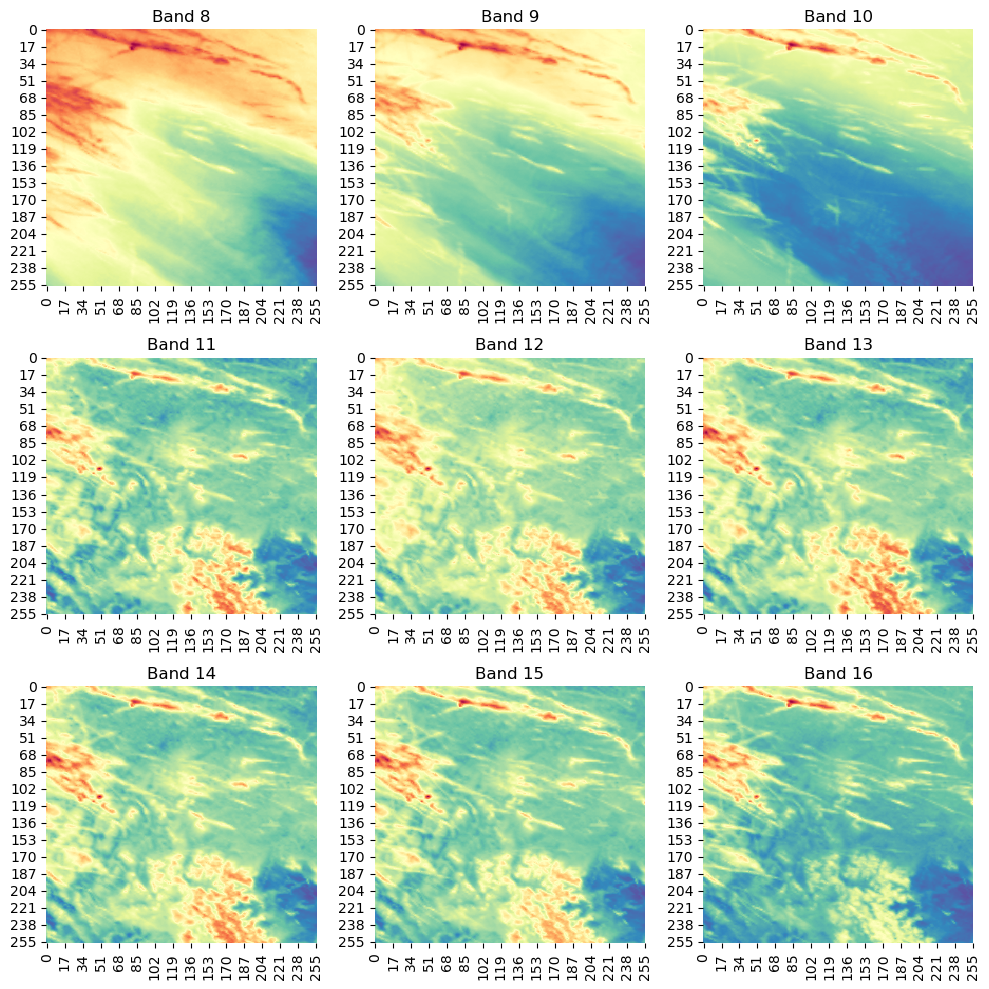

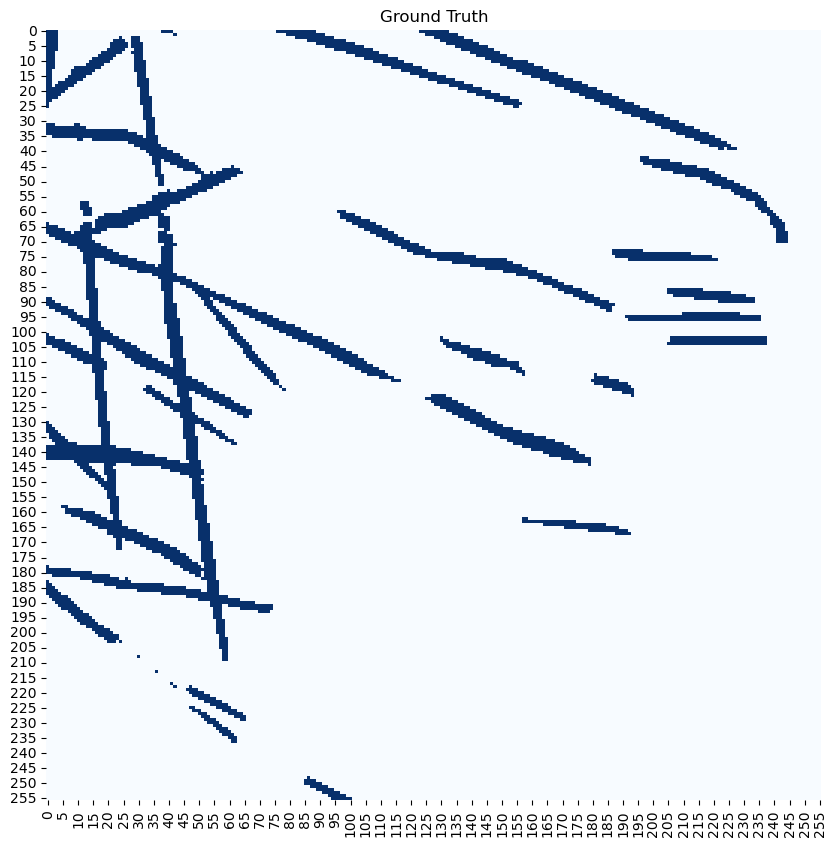

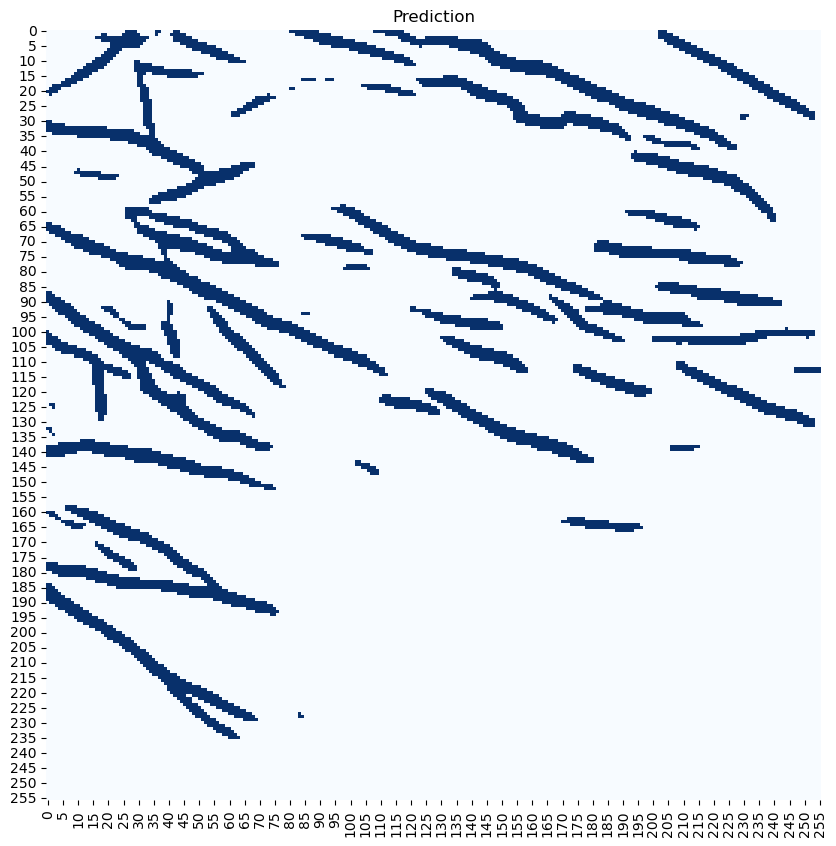

In [225]:
visualize_prediction(one_sample_folder_path, best_model)

In [226]:
import random

def generate_random_subfolder_paths(folder_path):
    subfolders = [f for f in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, f))]
    random_subfolders = random.sample(subfolders, min(10, len(subfolders)))
    subfolder_paths = [os.path.join(folder_path, subfolder) for subfolder in random_subfolders]
    return subfolder_paths

In [227]:
def predict_contrails(model, folder_path):
    band_images = preprocess_band_files(folder_path)
    band_images = np.expand_dims(band_images, axis=0)  # Add a batch dimension

    p0 = model.predict(band_images)[0, ..., 0]  # Original prediction

    # Flip image left-right, make a prediction, then unflip the prediction
    band_images_lr = np.flip(band_images, axis=2)
    p1 = model.predict(band_images_lr)[0, ..., 0]
    p1 = np.flip(p1, axis=1) 

    # Flip image up-down, make a prediction, then unflip the prediction
    band_images_ud = np.flip(band_images, axis=1)
    p2 = model.predict(band_images_ud)[0, ..., 0]
    p2 = np.flip(p2, axis=0)

    # Flip image left-right and up-down, make a prediction, then unflip the prediction
    band_images_lr_ud = np.flip(np.flip(band_images, axis=2), axis=1)
    p3 = model.predict(band_images_lr_ud)[0, ..., 0]
    p3 = np.flip(np.flip(p3, axis=1), axis=0)

    # Average the predictions
    prediction = (p0 + p1 + p2 + p3) / 4.0

    return prediction


def predict_contrails_binary(model, folder_path, threshold=0.5):
    prediction = predict_contrails(model, folder_path)
    return (prediction > threshold).astype(np.uint8)

def visualize_prediction_avg(folder_path, model, figsize=(10, 10), cmap='Spectral'):
    # Load the mask
    mask = np.load(f'{folder_path}/human_pixel_masks.npy')[:, :, 0]

    # Get the predicted mask
    predicted_mask = predict_contrails_binary(model, folder_path, 0.5)

    # Visualize band images
    visualize_band_images(folder_path)
   
    # Plot the ground truth mask
    plt.figure(figsize=figsize)
    sns.heatmap(mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Ground Truth')
    plt.show()

    # Plot the predicted mask
    plt.figure(figsize=figsize)
    sns.heatmap(predicted_mask, cmap='Blues', cbar=False, linewidths=0.0)
    plt.title('Averaged Prediction')
    plt.show()





1/1 [==============================] - 1s 1s/step


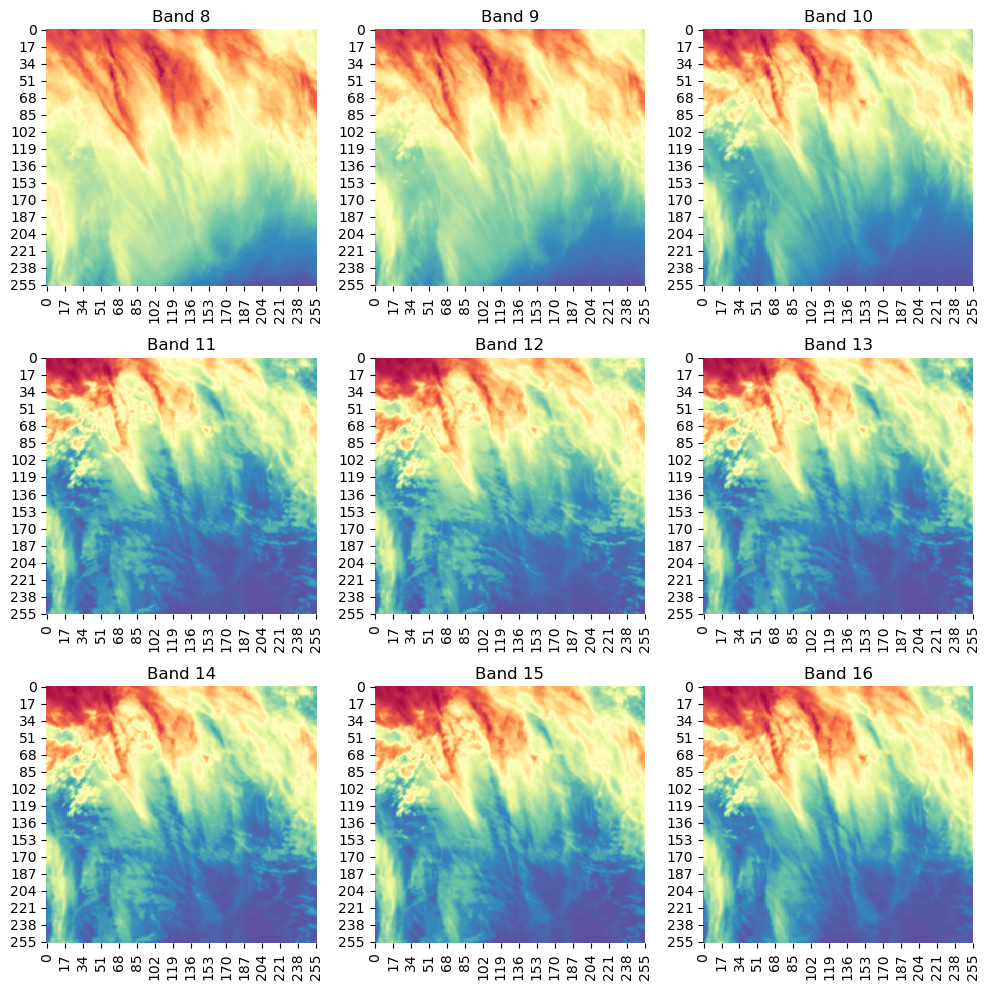

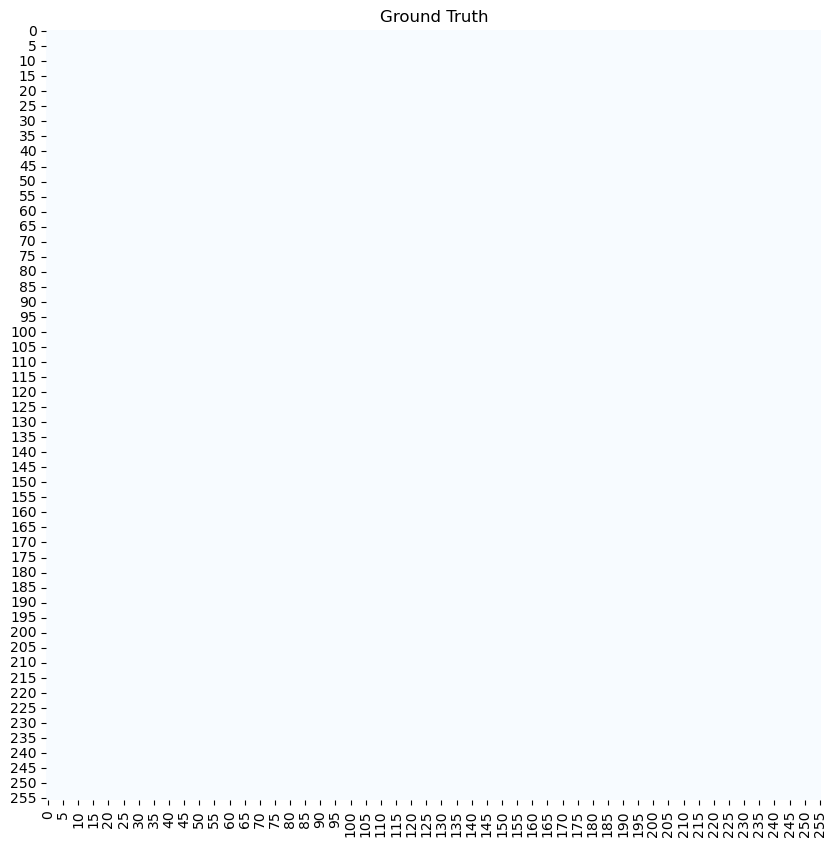

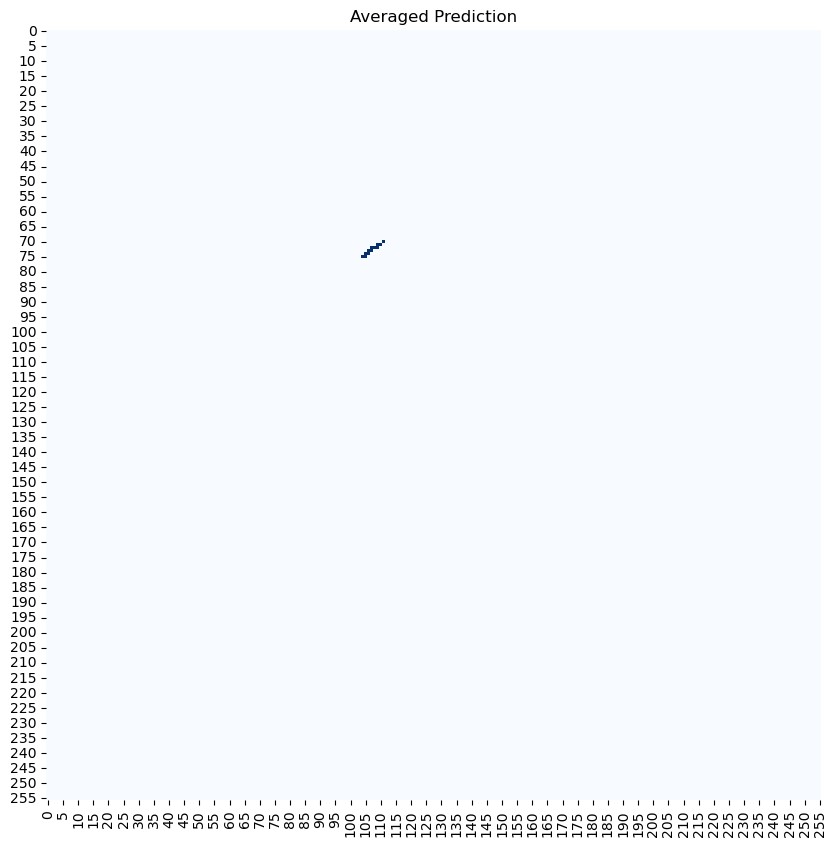

1/1 [==============================] - 1s 1s/step


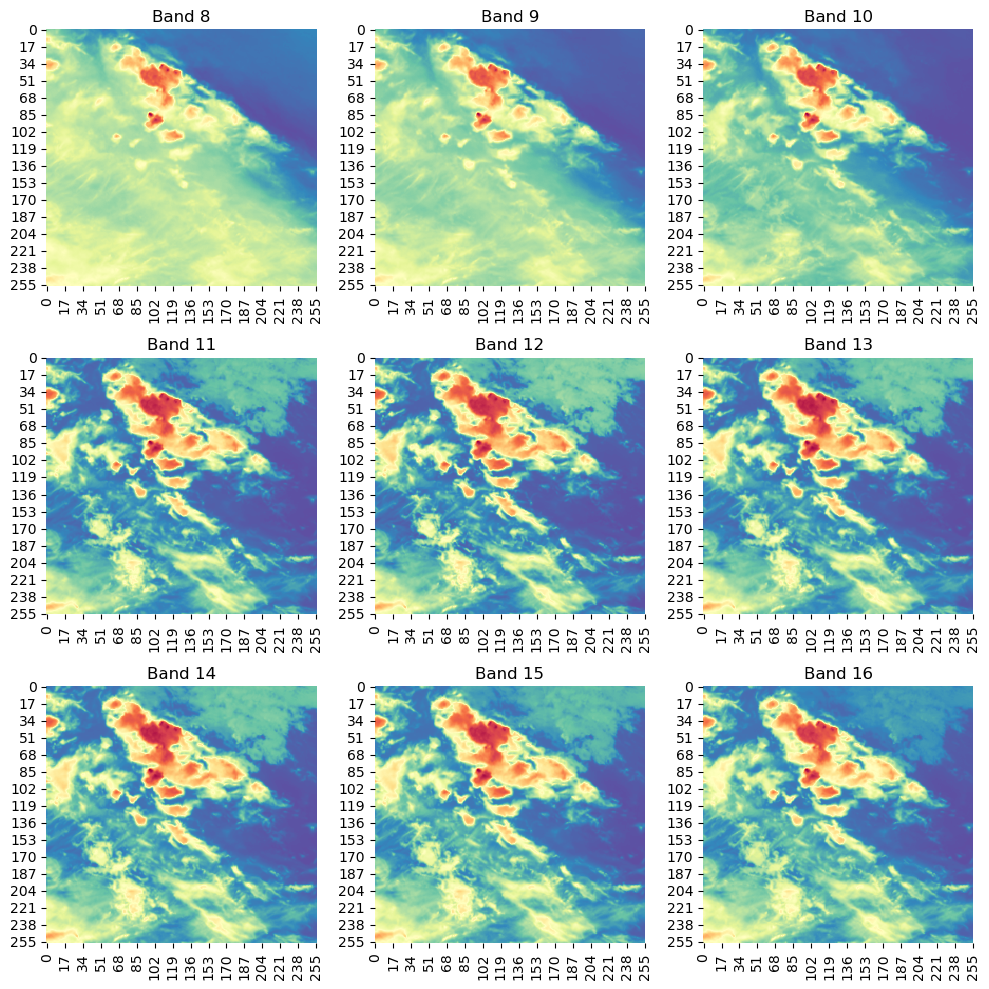

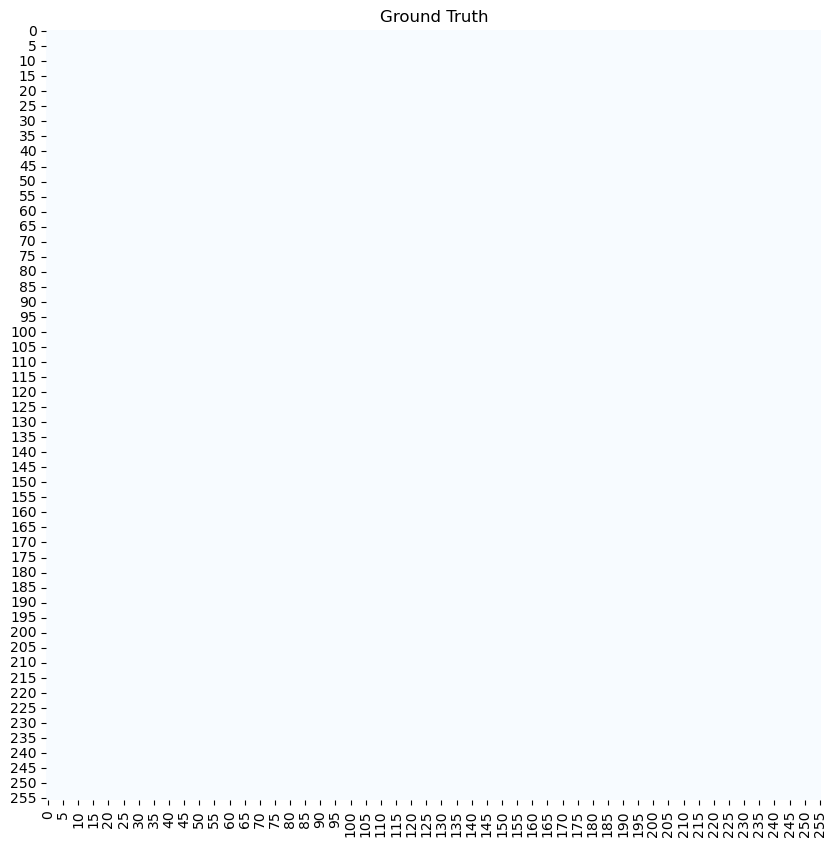

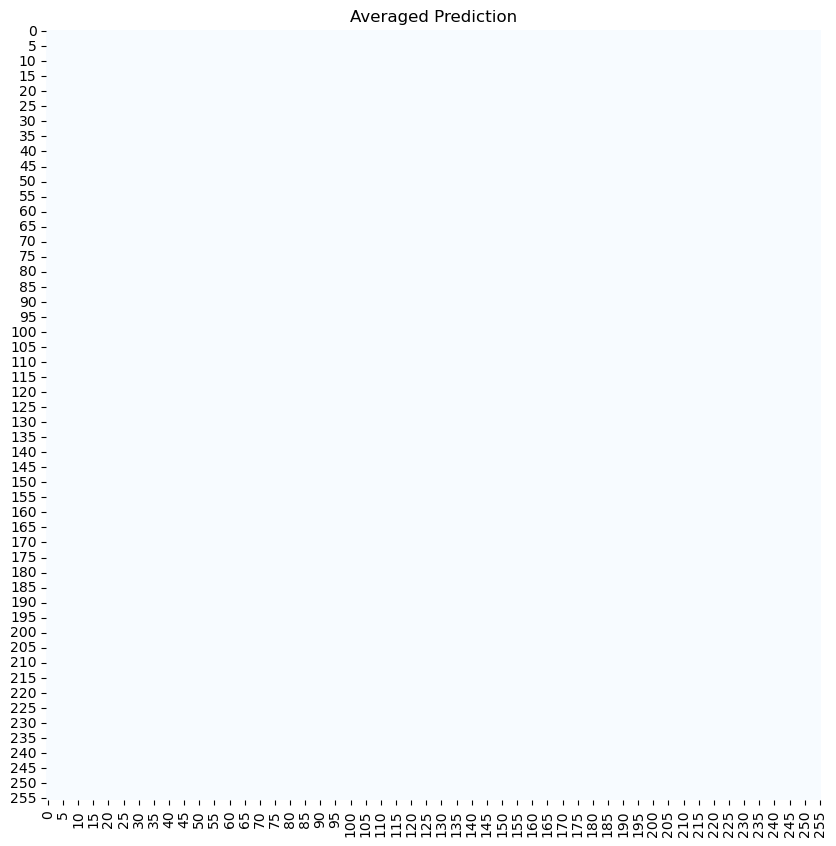

1/1 [==============================] - 1s 1s/step


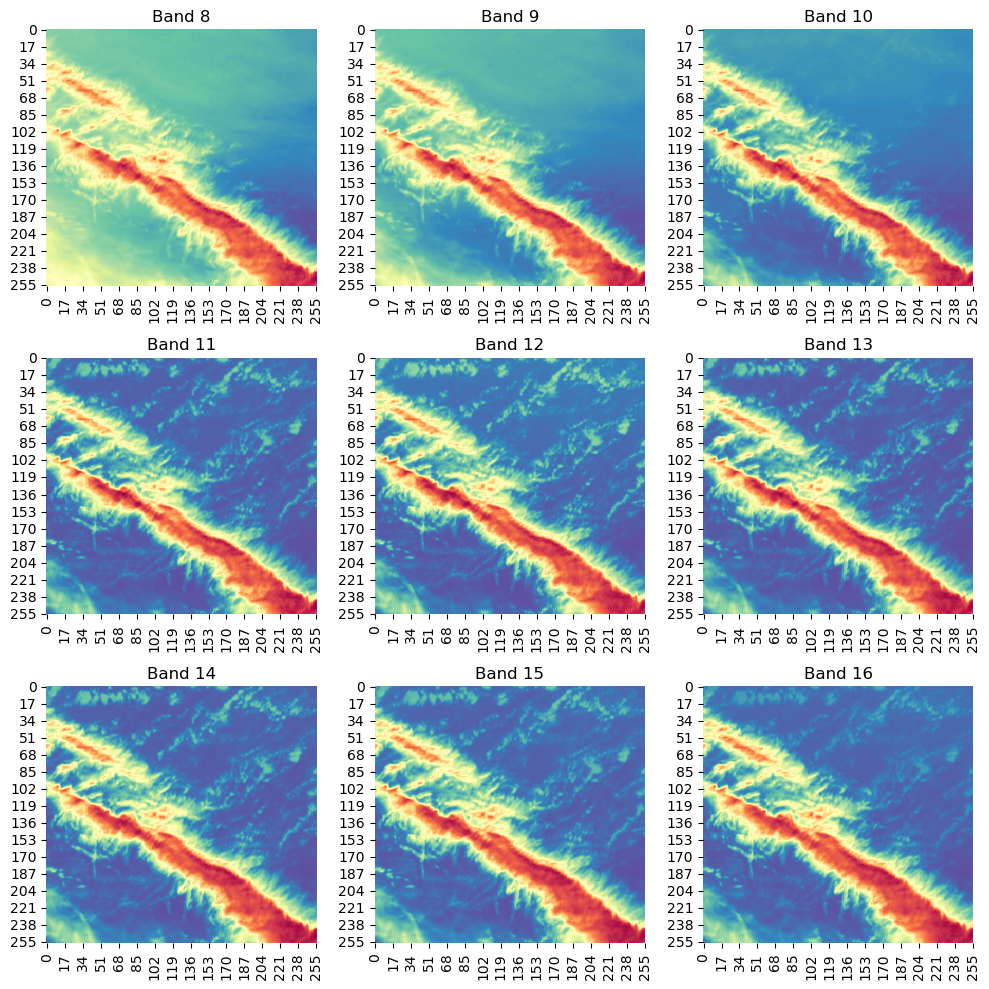

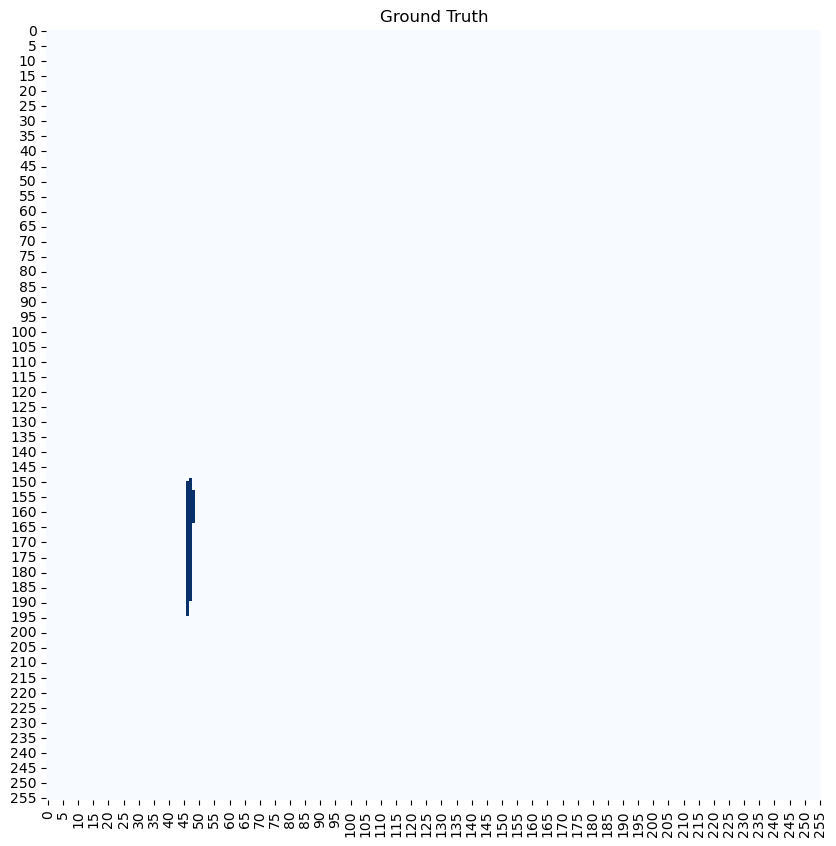

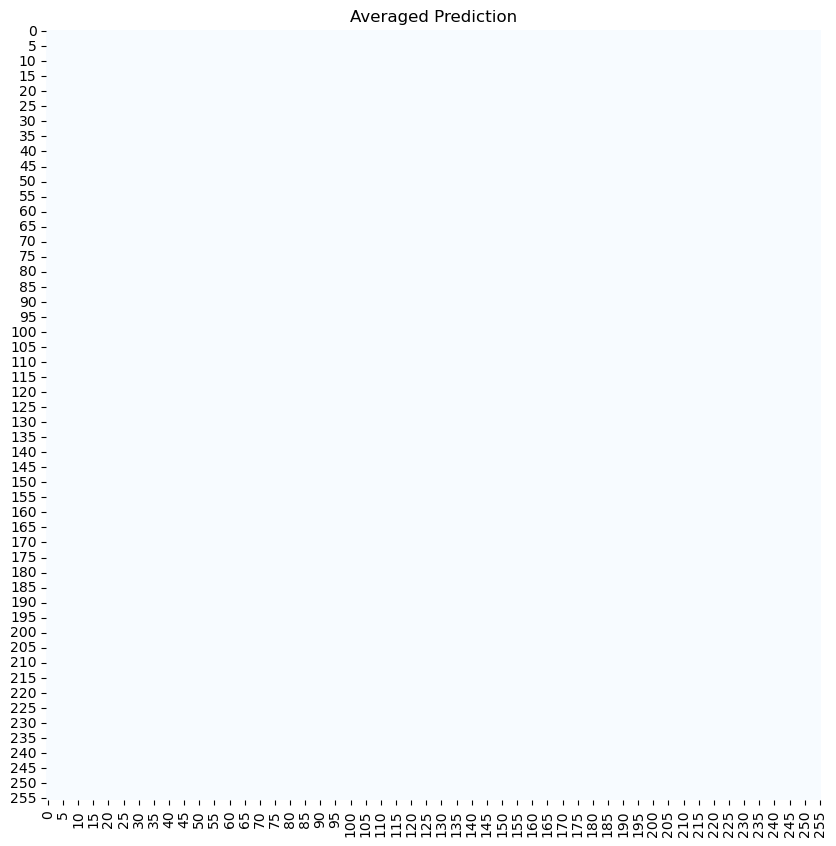

1/1 [==============================] - 1s 1s/step


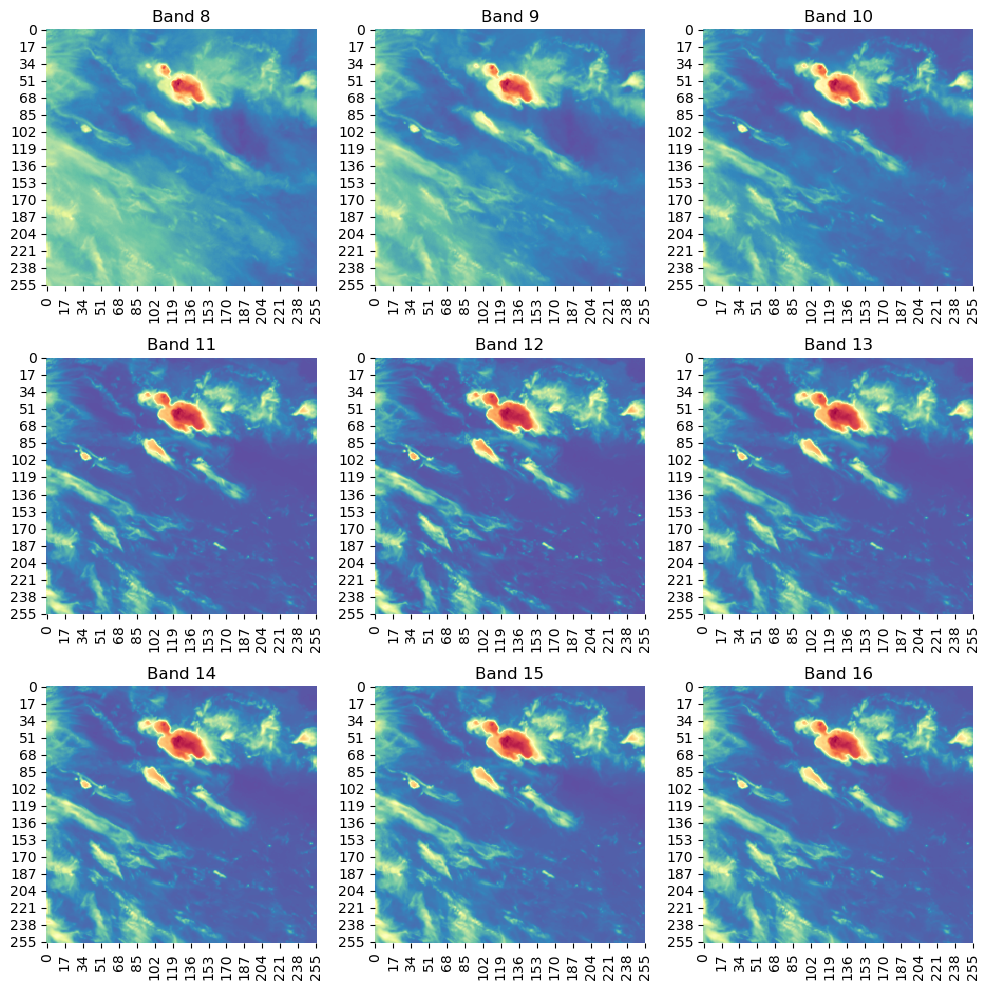

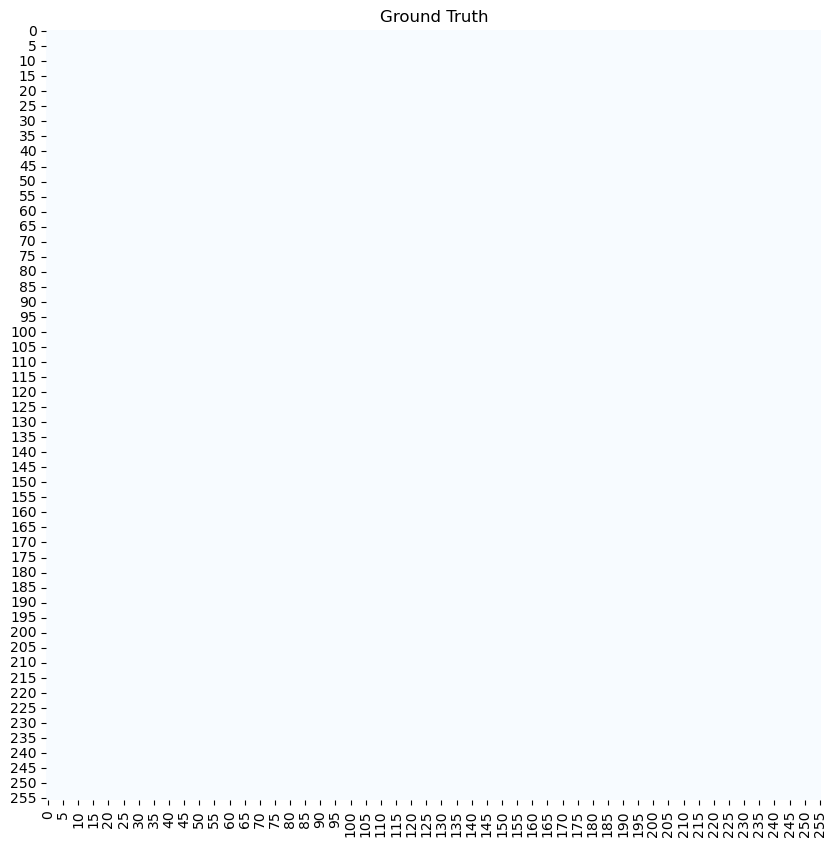

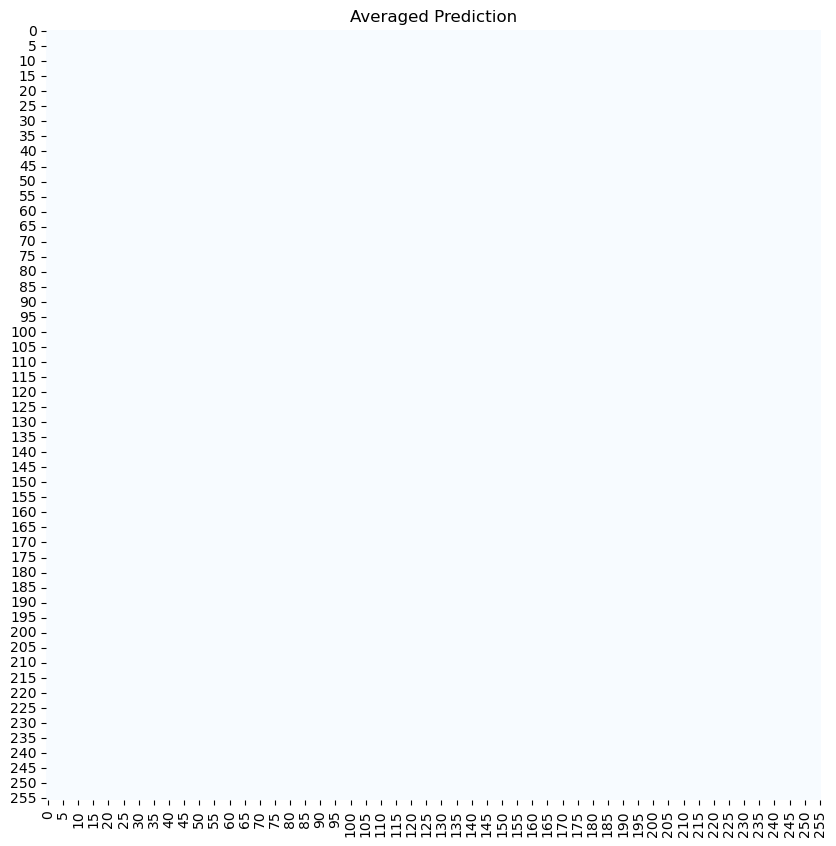

1/1 [==============================] - 1s 1s/step


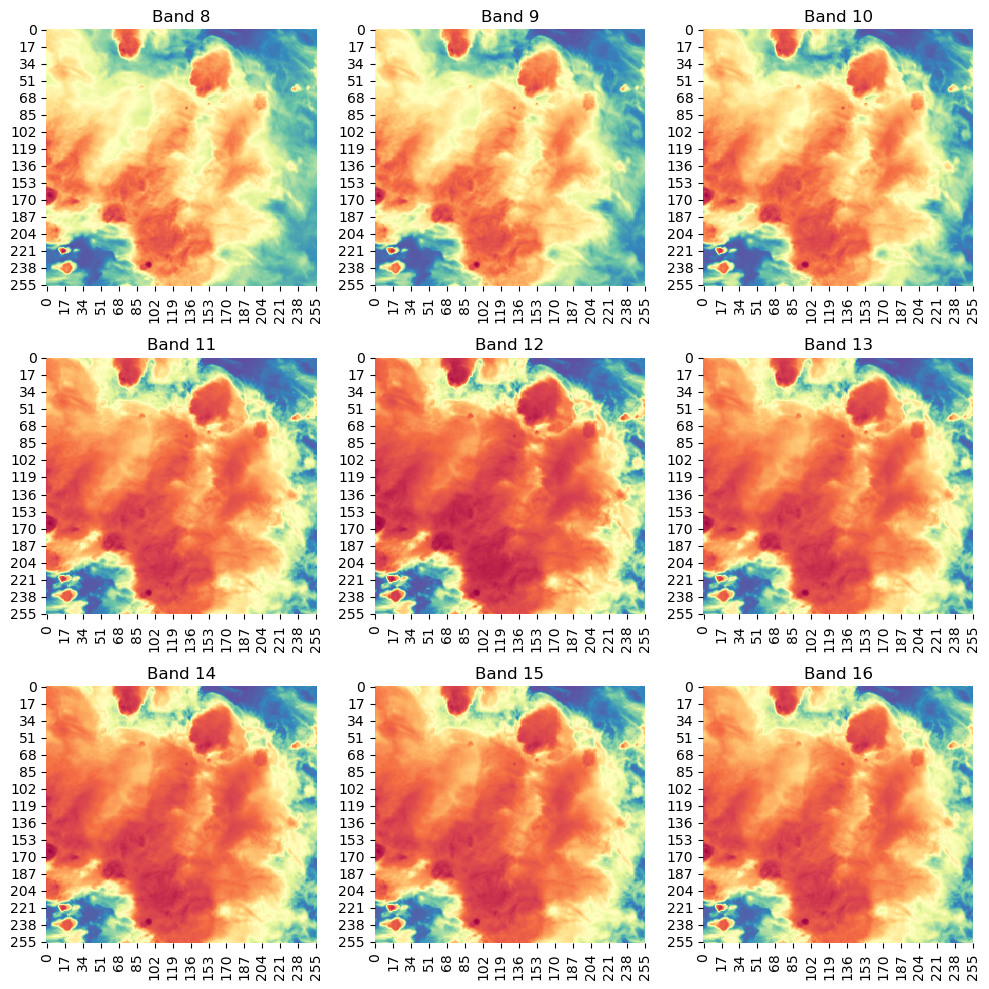

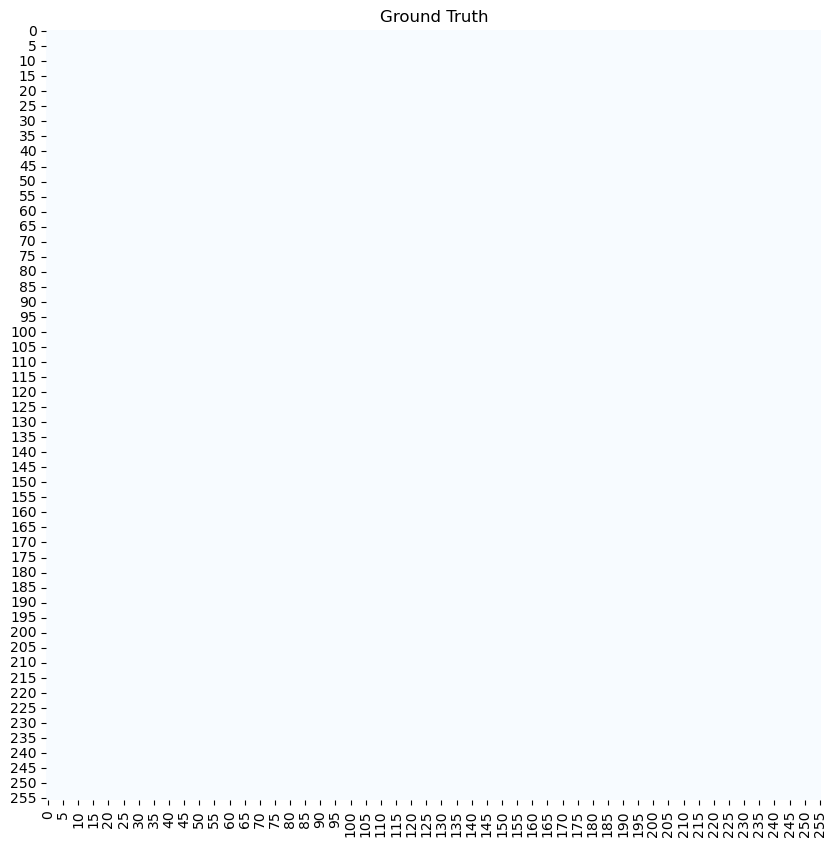

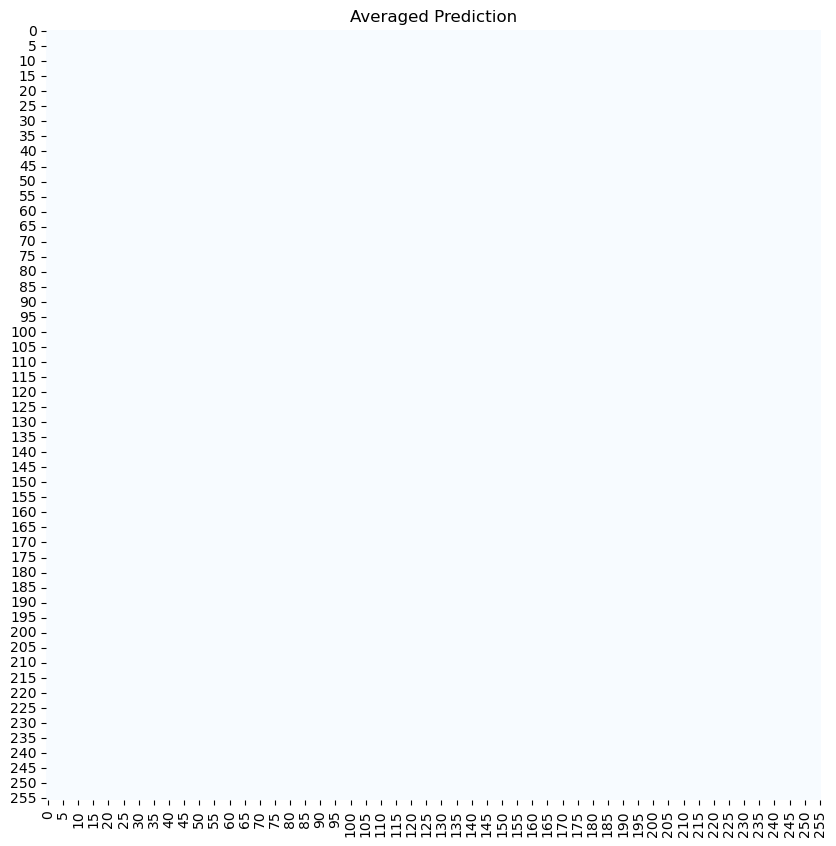

1/1 [==============================] - 1s 1s/step


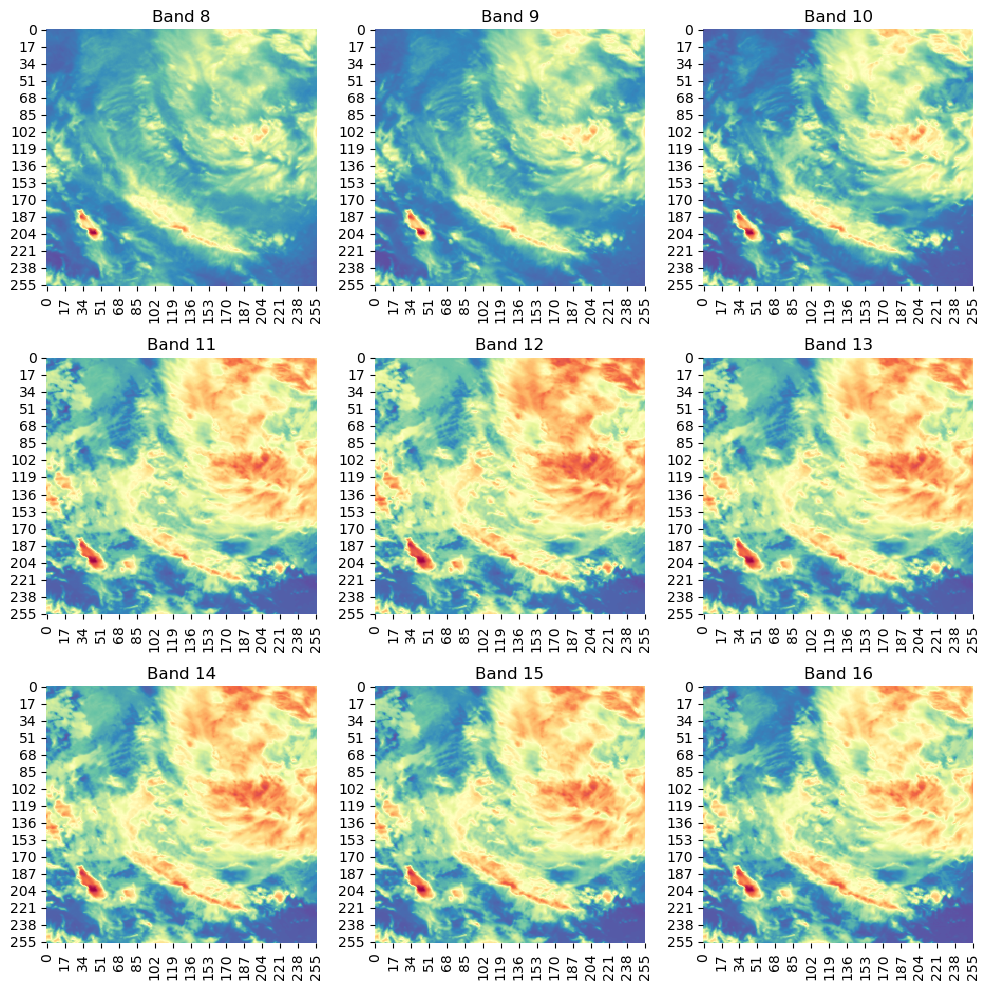

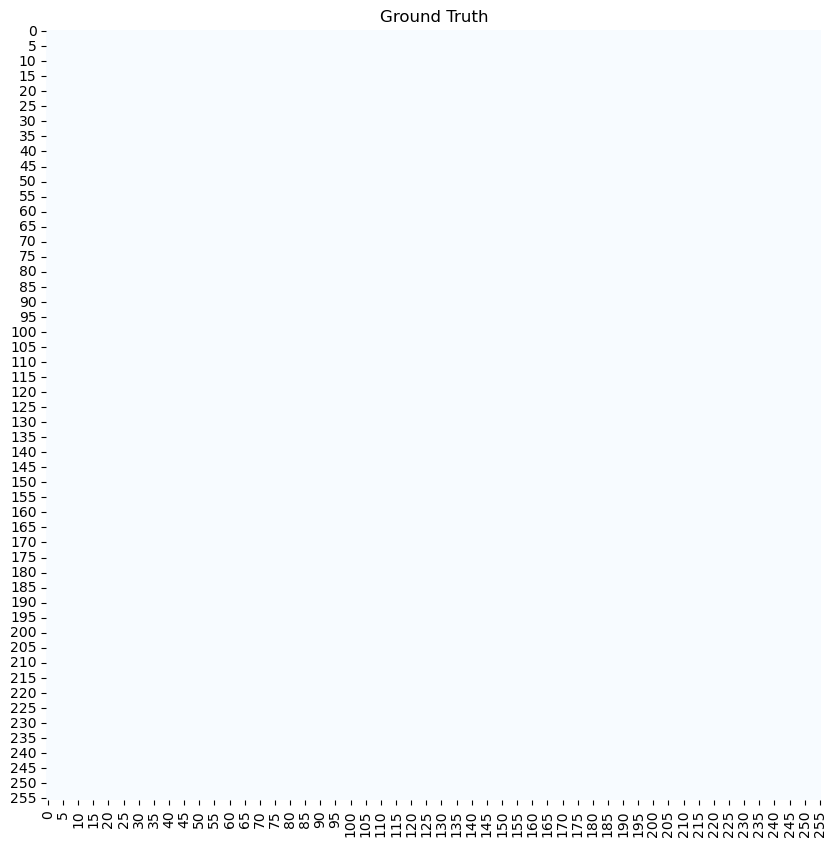

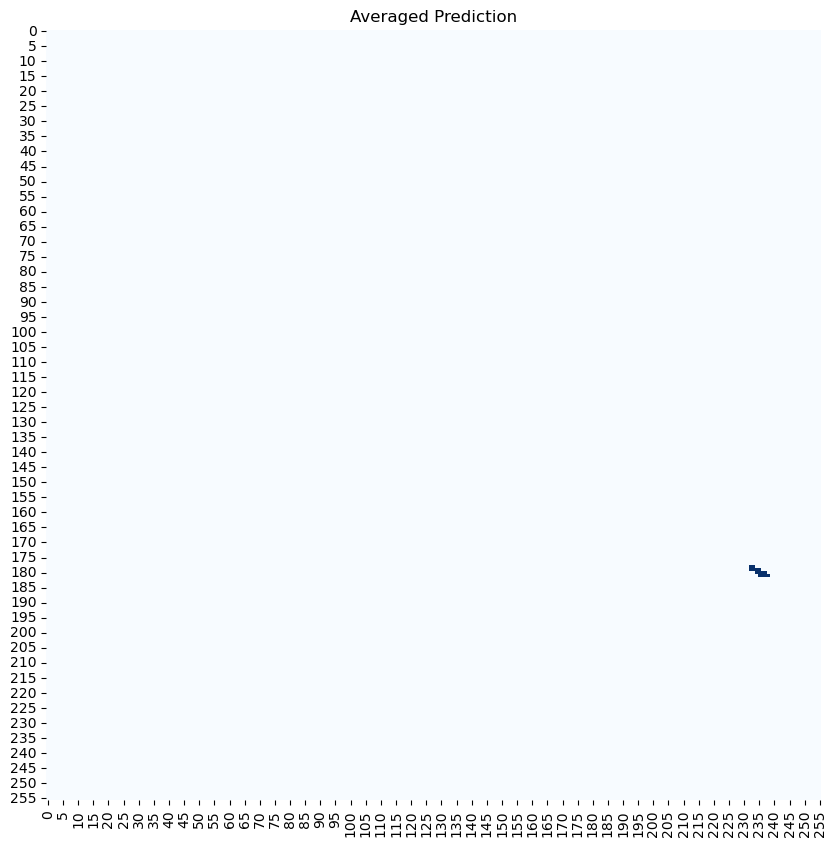

1/1 [==============================] - 1s 1s/step


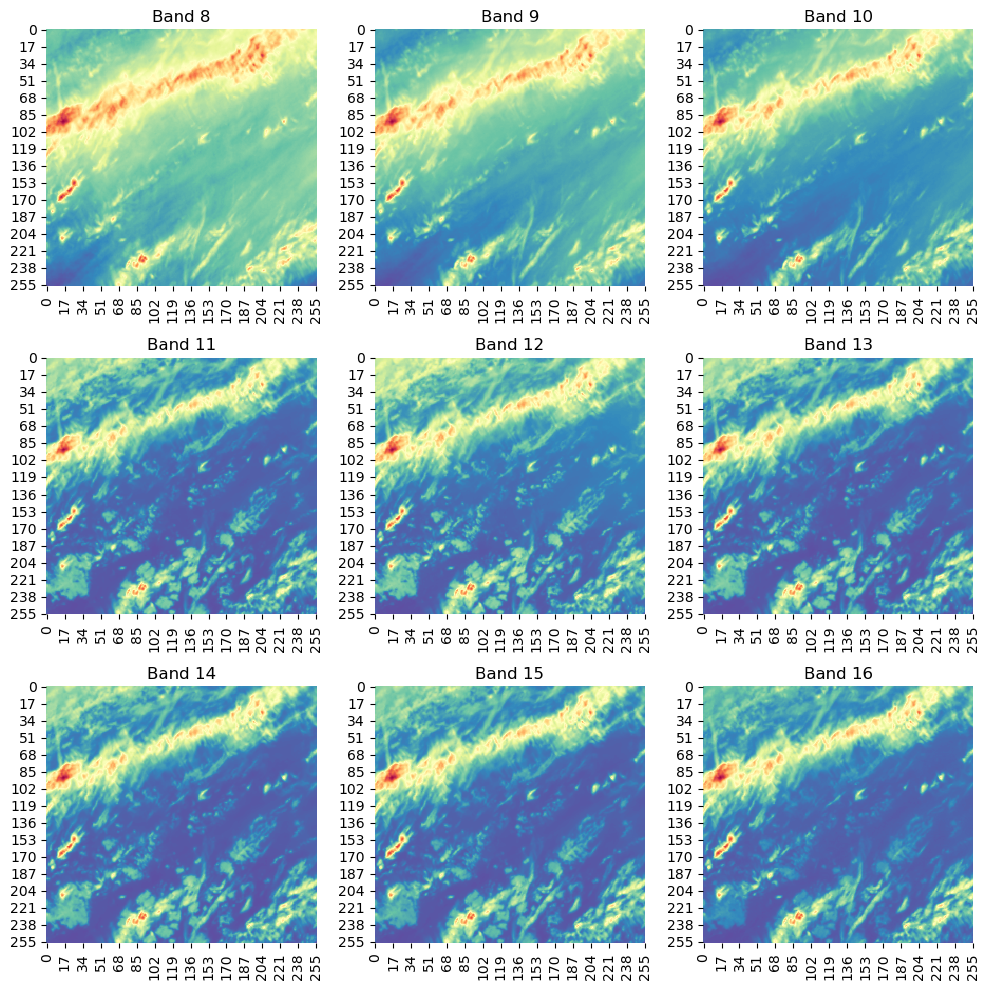

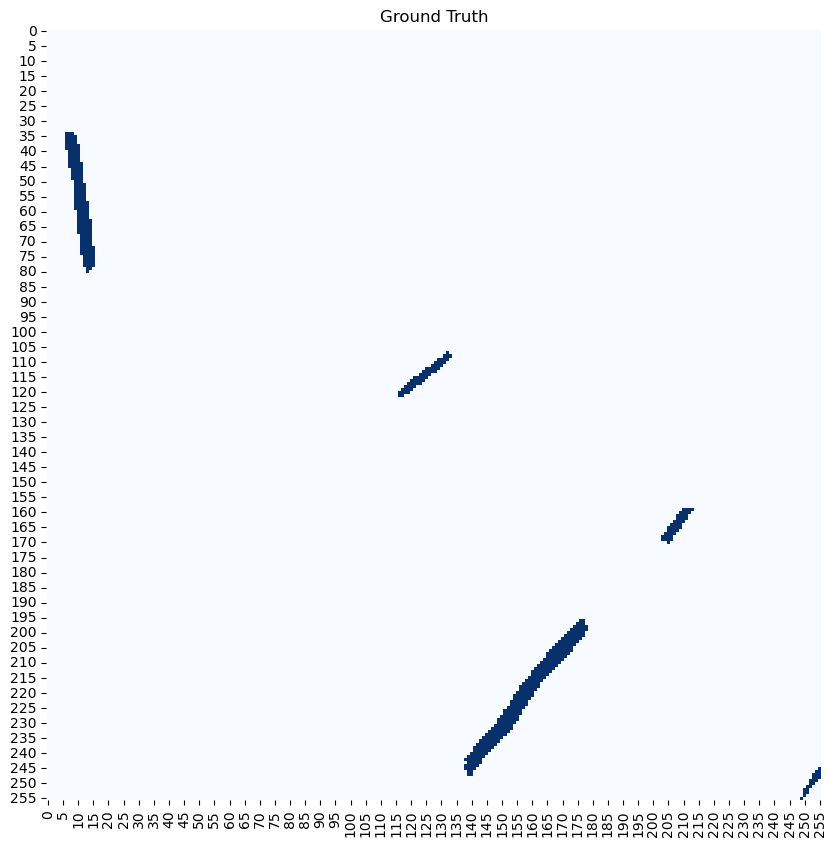

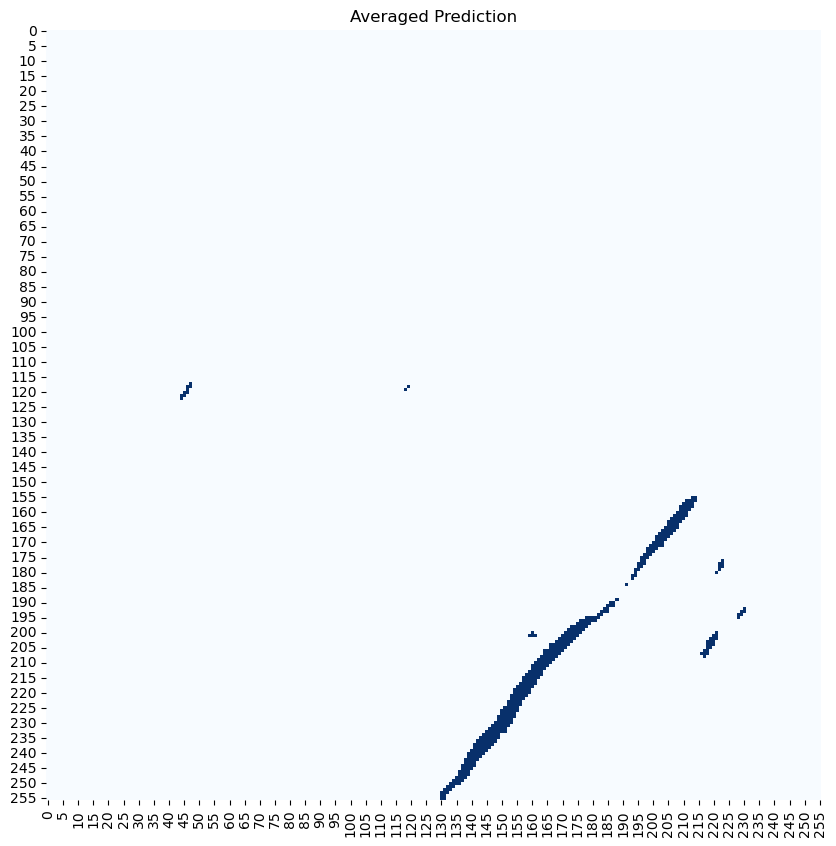

1/1 [==============================] - 1s 1s/step


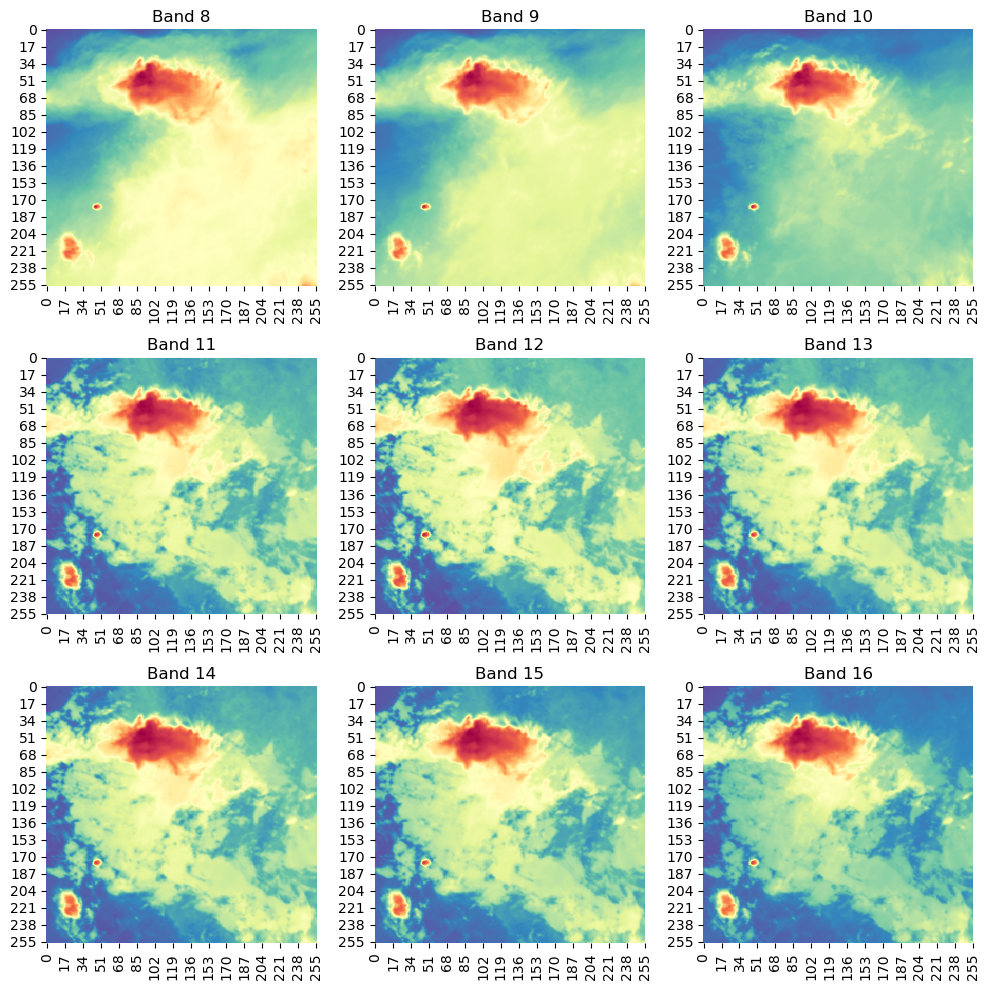

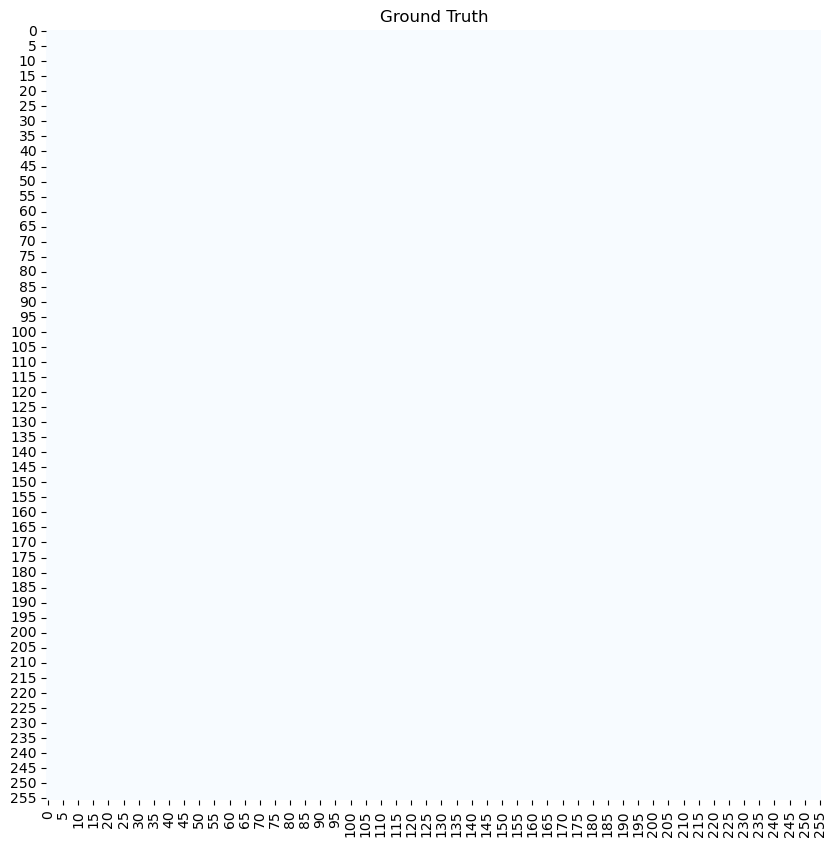

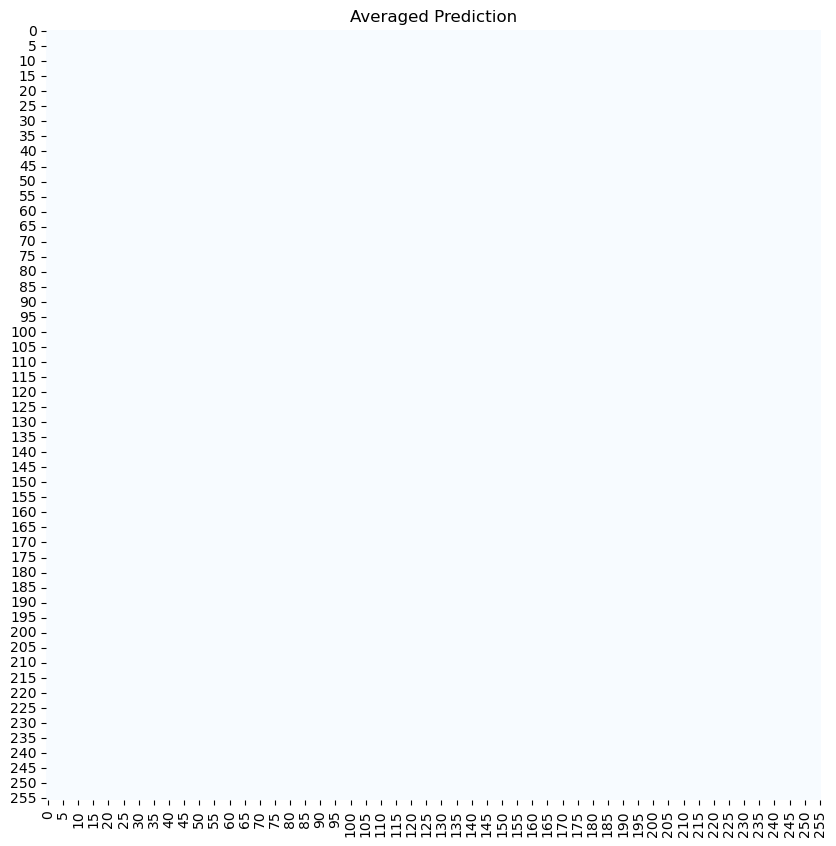

1/1 [==============================] - 1s 1s/step


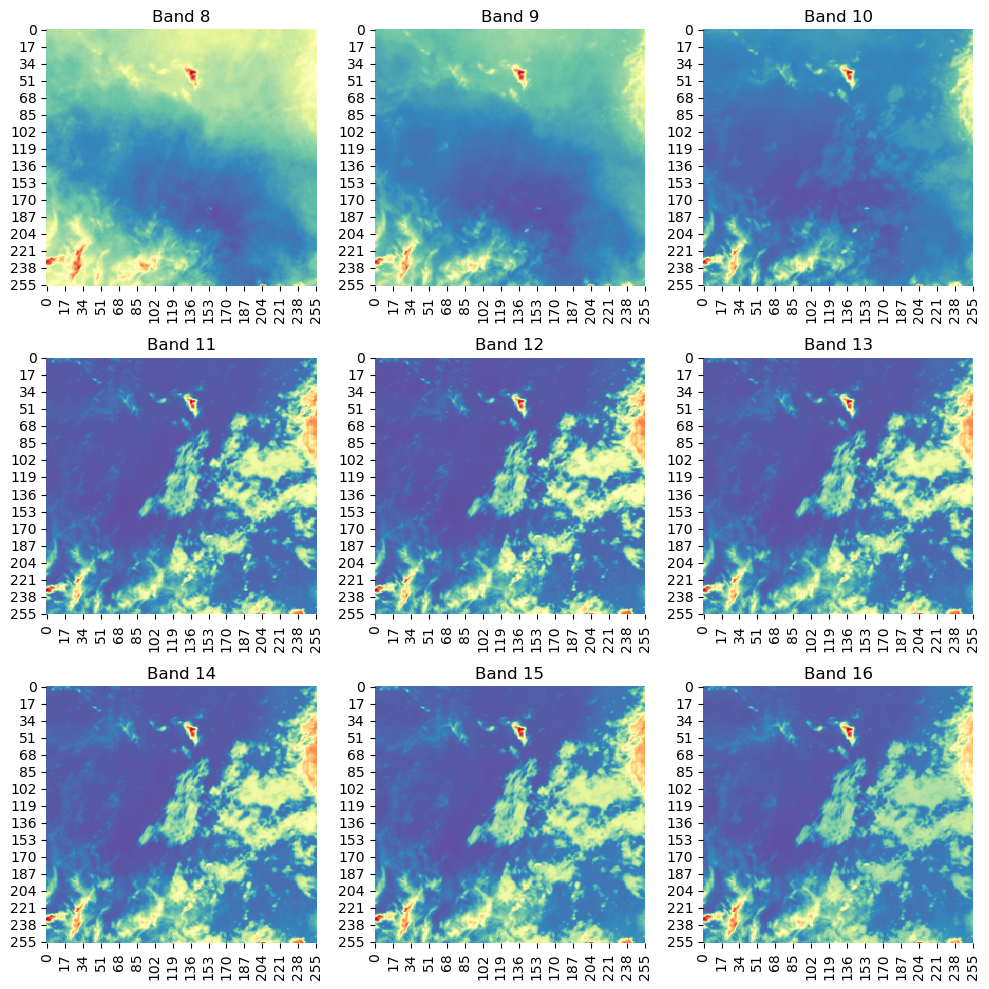

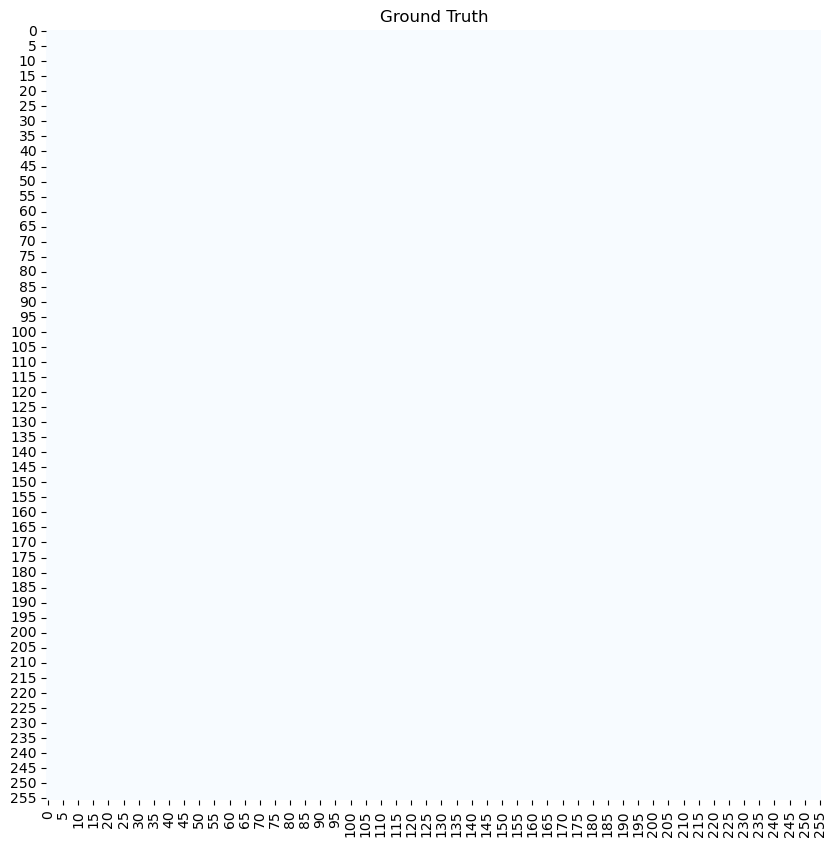

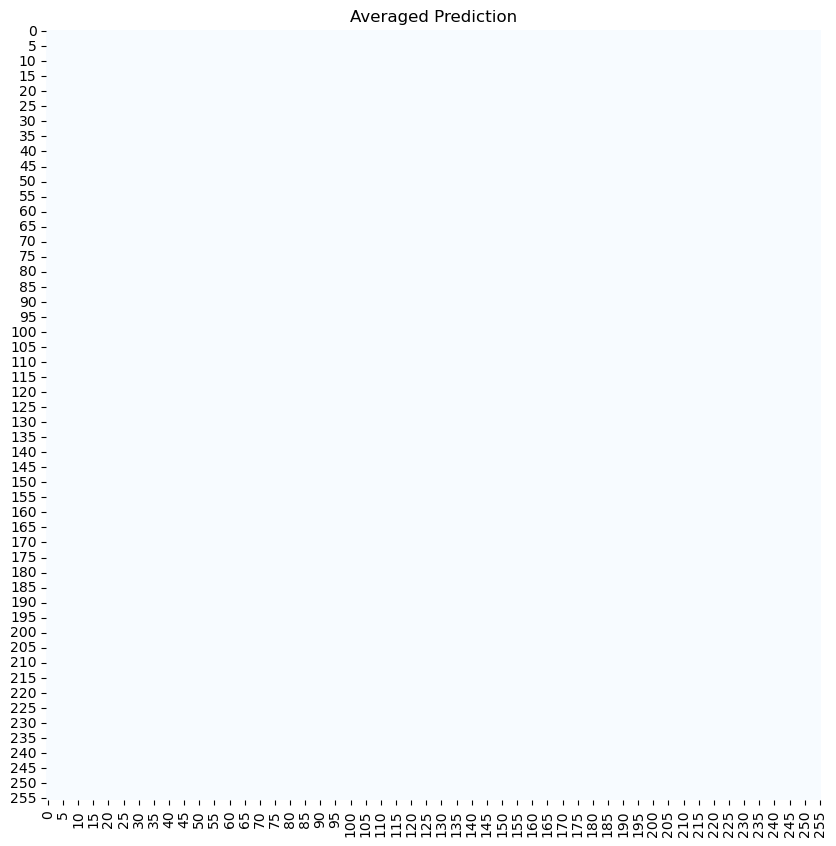

1/1 [==============================] - 1s 1s/step


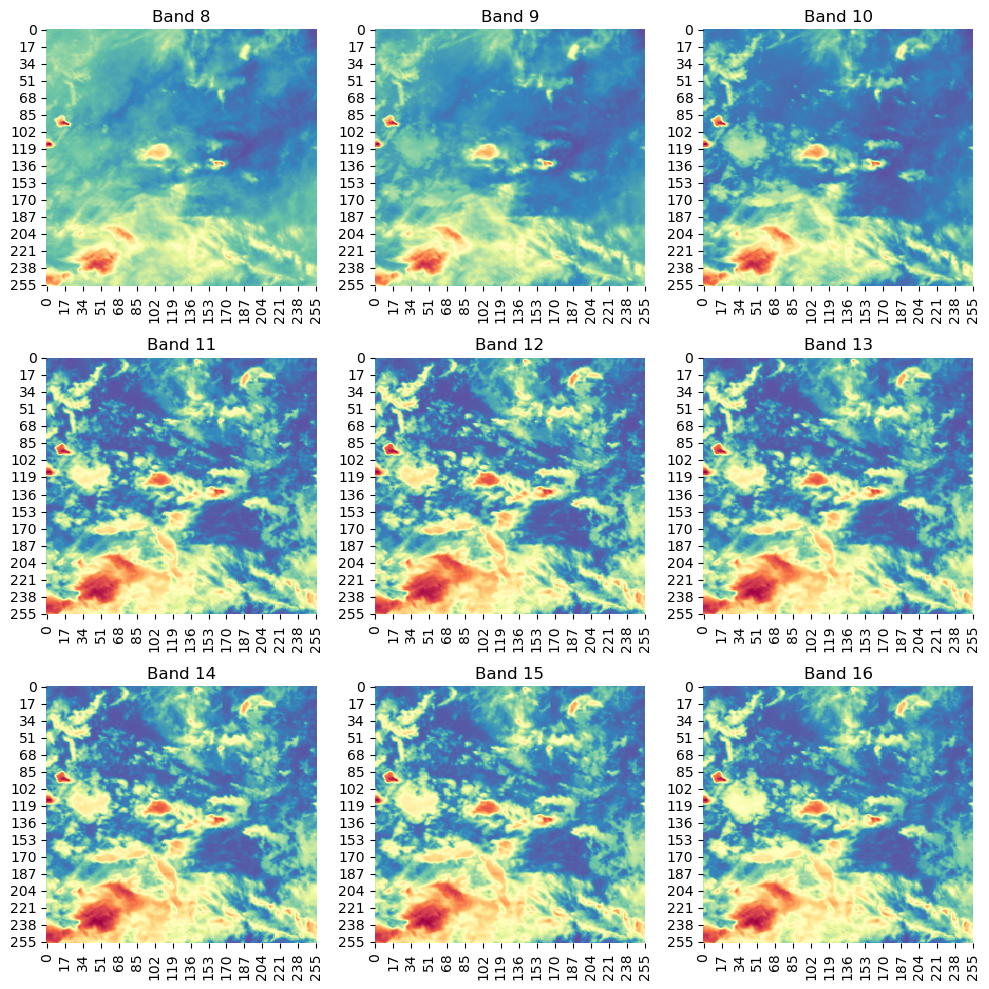

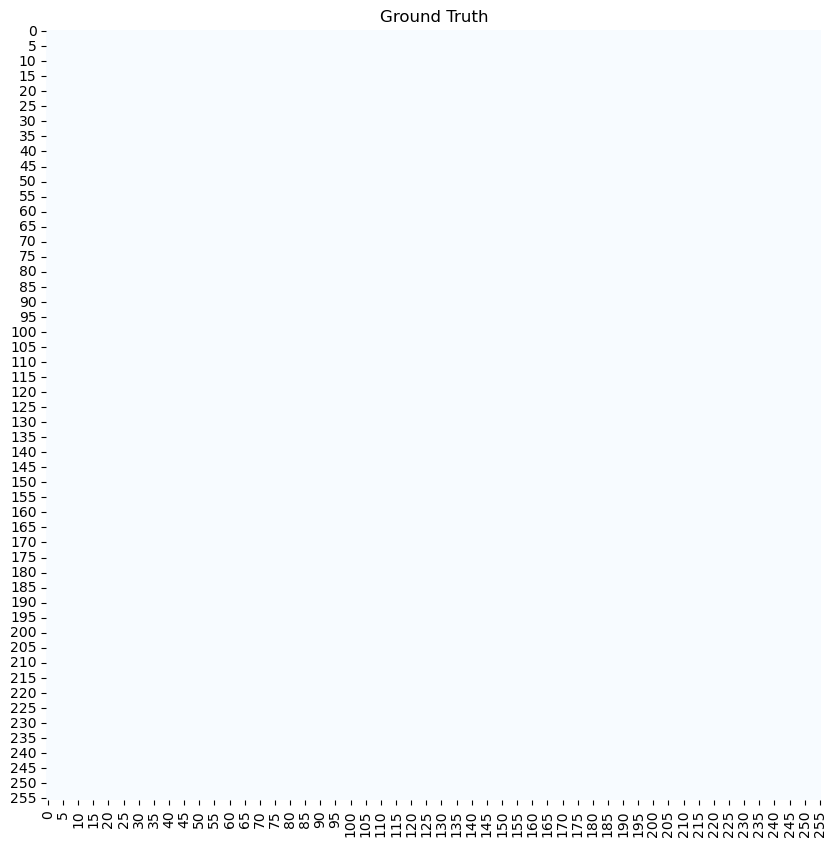

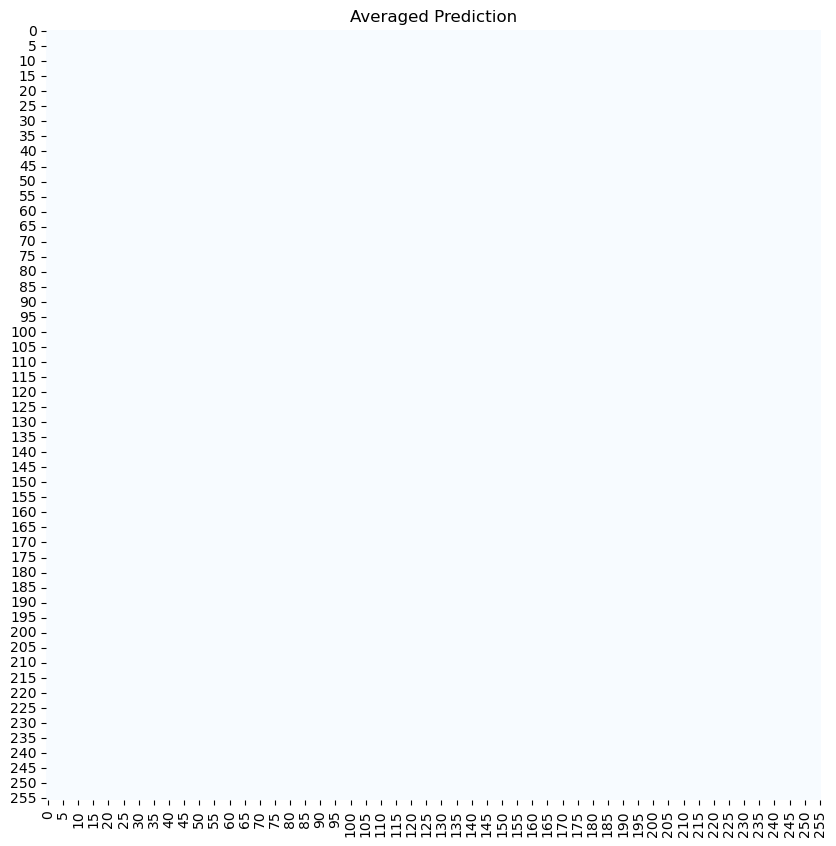

In [228]:
ten_random_subfolders = generate_random_subfolder_paths(validation_folder)
for folder in ten_random_subfolders:
    visualize_prediction_avg(folder, best_model)